In [45]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [46]:
!pip install -q diffusers transformers accelerate invisible-watermark>=0.2.0 scipy safetensors

In [47]:
import torch

In [48]:
torch.cuda.is_available()

True

In [49]:
prompt = "A fashion designer, splattered with colours, paintings behind her."

### You can write your own prompt or choose from the following prompts as well:

1. "A Hacker coding on a computer with neon screens behind him."
2. "Blacksmith shaping iron, infront of a forge"
3. "A nature lover, surrounded by forests and mountains,looking at a butterfly."
4. "A dedicated athlete running on a track."
5. "A fashion designer, splattered with colours, paintings behind her."
6. "An astronaut standing on the moon, with a starry abyss infront of him."
7. "Baker baking bread, standing in a kitchen, oven beside him."
8. "Diver, looking at a fish, coral reef"
9. "Firefighter using a water house, spraying water on a burning building."
10. "Scientist, experimenting with chemicals in a lab."



If you are limited by GPU VRAM, you can enable cpu offloading by calling pipe.enable_model_cpu_offload instead of .to("cuda"):

- Remove: pipe.to("cuda")
+ Add: pipe.enable_model_cpu_offload()

Doc: https://huggingface.co/stabilityai/stable-diffusion-xl-refiner-1.0


### SDXL Base 1.0
https://huggingface.co/docs/diffusers/en/using-diffusers/sdxl


In [50]:
from diffusers import AutoPipelineForText2Image

pipeline_text2image = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
).to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

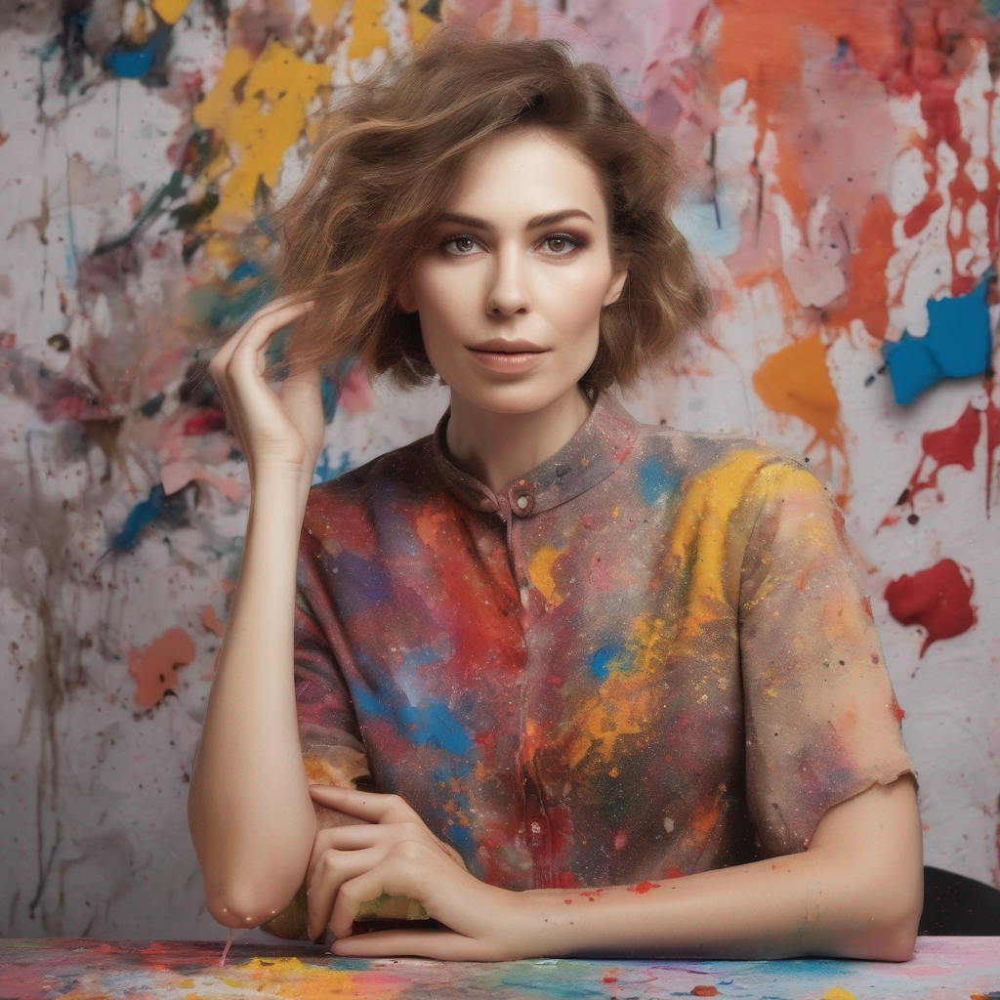

In [51]:
image = pipeline_text2image(prompt=prompt).images[0]
image

### SDXL-Turbo
https://huggingface.co/stabilityai/sdxl-turbo

In [52]:
from diffusers import AutoPipelineForText2Image

pipe = AutoPipelineForText2Image.from_pretrained("stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16")
pipe.enable_model_cpu_offload()


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

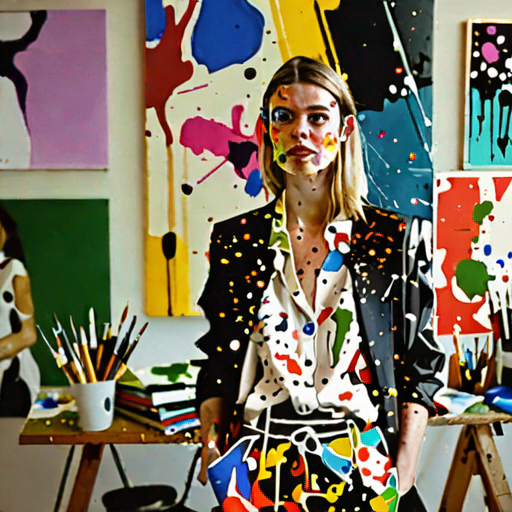

In [53]:
image = pipe(prompt).images[0]
image

### Runway-ML
https://huggingface.co/runwayml/stable-diffusion-v1-5

In [54]:
from diffusers import StableDiffusionPipeline
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

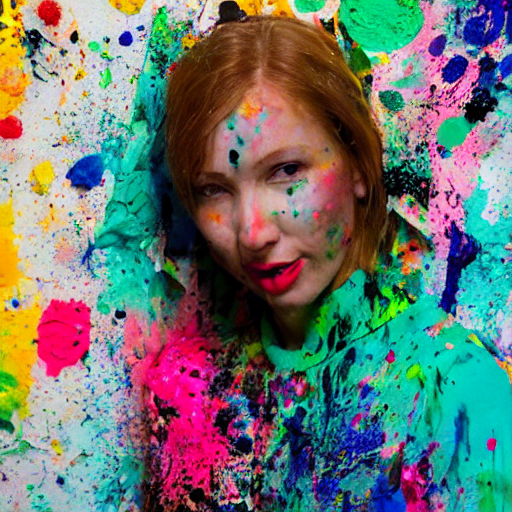

In [55]:
image = pipe(prompt).images[0]
image

### DreamLike Photo-Real 2.0

https://huggingface.co/dreamlike-art/dreamlike-photoreal-2.0

In [56]:

from diffusers import StableDiffusionPipeline

model_id = "dreamlike-art/dreamlike-photoreal-2.0"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

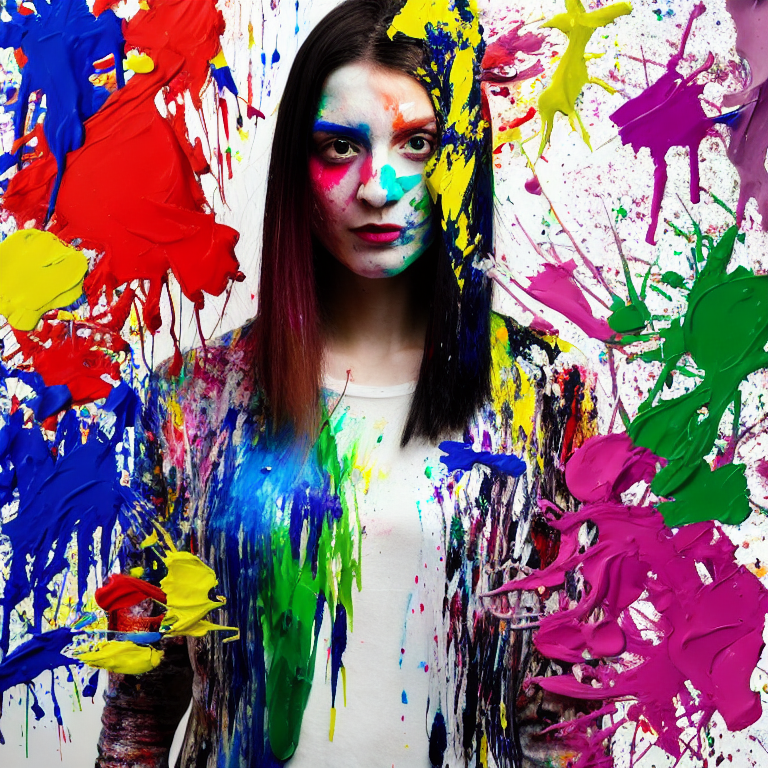

In [57]:
low_res_img = pipe(prompt).images[0]
low_res_img

In [58]:
from PIL import Image

# Assuming img_res_low is your PIL image object
width, height = low_res_img.size

print("Width:", width)
print("Height:", height)


Width: 768
Height: 768


In [59]:
low_res_img=low_res_img.resize((1024,1024))
# low_res_img.save("/content/drive/MyDrive/Colab Notebooks/Test_1.png")

### Upscaling the image

In [60]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Swin2SR- x4 Scaler
https://huggingface.co/caidas/swin2SR-realworld-sr-x4-64-bsrgan-psnr

In [61]:
import torch
import numpy as np
from PIL import Image

from transformers import AutoImageProcessor, Swin2SRForImageSuperResolution

# Load the pre-trained model and processor
processor = AutoImageProcessor.from_pretrained("caidas/swin2SR-classical-sr-x2-64")
model = Swin2SRForImageSuperResolution.from_pretrained("caidas/swin2SR-classical-sr-x2-64")

# Modify to use local image path
# image_path = "/kaggle/working/Test_1.png"

# Open the image using PIL
# image = Image.open(image_path)

# Prepare image for the model
inputs = processor(low_res_img, return_tensors="pt")

# Forward pass
with torch.no_grad():
    outputs = model(**inputs)

# Process and convert output to NumPy array
output = outputs.reconstruction.data.squeeze().float().cpu().clamp_(0, 1).numpy()
output = np.moveaxis(output, source=0, destination=-1)
output = (output * 255.0).round().astype(np.uint8)  # float32 to uint8

upscaled_image = Image.fromarray(output)
# upscaled_image.show()
# upscaled_image.save("output.png")  # Save the upscaled image (optional)


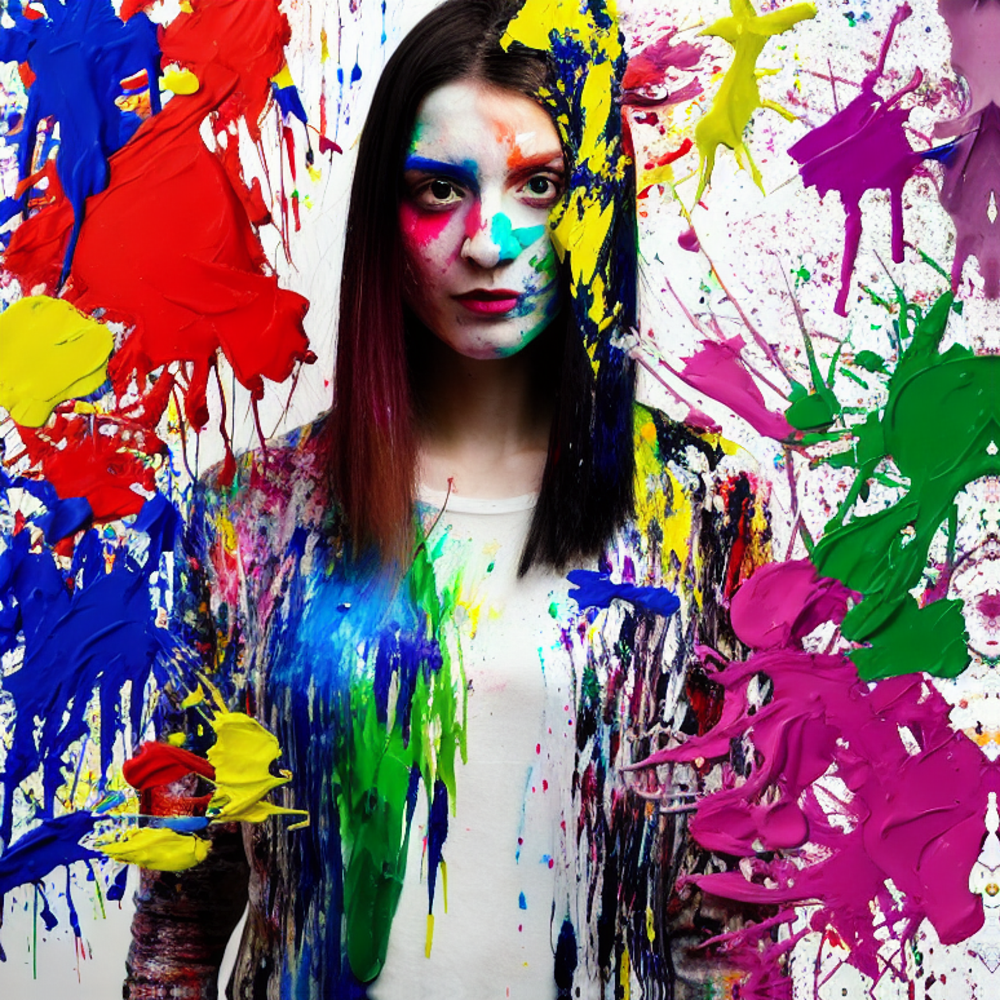

In [62]:
upscaled_image

In [63]:
#Initial Resolution

width, height = upscaled_image.size

print("Width:", width)
print("Height:", height)

Width: 2064
Height: 2064


In [64]:
upscaled_image=upscaled_image.resize((2048,2048))
width, height = upscaled_image.size

print("Width:", width)
print("Height:", height)

Width: 2048
Height: 2048
